In [1]:
import umap 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pickle
import dgl
import torch
import plotly.express as px
import matplotlib.ticker as plticker

# set seeds
torch.manual_seed(0)
import random
random.seed(0)
import numpy as np
np.random.seed(0)

cos = torch.nn.CosineSimilarity(dim=0, eps=1e-08)

/n/sw/Mambaforge-22.11.1-4/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# read in trained embeddings
h_graph = pickle.load(open("/n/holylabs/LABS/mzitnik_lab/Users/ruthjohnson/transfer/full_h_embed_hms.pkl", 'rb'))

# meta data files
node_map_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/construct_kg/phekg/new_node_map_df.csv")
node_map_df = node_map_df.sort_values(by='global_graph_index')

defn_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/construct_kg/phekg/phecode_definitions1.2.csv")
part_df = pd.read_csv("/n/home01/ruthjohnson/kg_paper/umap/Part.csv")

system_part_list = part_df.loc[part_df['PartTypeName'] == 'COMPONENT']['PartNumber'].values
system_part_inds = node_map_df.loc[node_map_df['node_id'].isin(system_part_list)]['global_graph_index'].values.tolist()

# Global UMAP

## Run umap and add metadata

In [3]:
# list of phecode indices
keep_cat_list = ['infectious diseases', 'neoplasms', 'endocrine/metabolic',
       'hematopoietic', 'mental disorders', 'neurological',
       'sense organs',  'digestive',
       'genitourinary', 'dermatologic', 'respiratory', 'circulatory system',
       'musculoskeletal']

phecode_df = node_map_df.loc[node_map_df['ntype'] == 'PHECODE']
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(float))
phecode_df = phecode_df.merge(defn_df[['category', 'phecode']], left_on='node_id', right_on='phecode', how='left')
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(str))

phecode_inds = phecode_df.loc[phecode_df['category'].isin(keep_cat_list)]['global_graph_index'].values.tolist()
#phecode_inds = phecode_df['global_graph_index'].values.tolist()

# list of ATC indices
atc_df = node_map_df.loc[node_map_df['ntype'] == 'ATC4']
atc_df = atc_df.assign(category=atc_df['node_id'].str.slice(0,1))
keep_atc_list = ['A', 'B', 'C', 'D', 'G', 'H', 'M', 'N', 'R', 'S']
atc_inds = atc_df.loc[atc_df['category'].isin(keep_atc_list)]['global_graph_index'].values.tolist()
#atc_inds = atc_df['global_graph_index'].values.tolist()

# CPT codes
cpt_df = node_map_df.loc[node_map_df['ntype'] == 'CPT']
cpt_df = cpt_df[pd.to_numeric(cpt_df['node_id'], errors='coerce').notnull()]
cpt_df = cpt_df.assign(node_id=cpt_df['node_id'].astype(int))

cpt_df = cpt_df.assign(node_id=cpt_df['node_id'].astype(str))
cpt_inds = cpt_df['global_graph_index'].values.tolist()
cpt_df['category'] = cpt_df['node_id'].str.slice(0,1)

# ICD codes
icd_df = node_map_df.loc[node_map_df['ntype'] == 'ICD9CM']
icd_inds = icd_df['global_graph_index'].values.tolist()
icd_df['category'] = "ICD9CM"

/tmp/ipykernel_118629/1742622169.py:35: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_df['category'] = "ICD9CM"


In [4]:
#
# Run UMAP

# get embeddings
embed_mat = h_graph[[cpt_inds + system_part_inds + phecode_inds + atc_inds]].numpy()
embed_mat = umap.UMAP(n_components=2, metric='cosine', n_neighbors=50, min_dist=0.4).fit_transform(embed_mat)

In [5]:
# add metadata and labels
embed_df = pd.DataFrame(embed_mat)
diag_df = node_map_df.loc[node_map_df['global_graph_index'].isin(cpt_inds + system_part_inds + phecode_inds + atc_inds)]
embed_df['node_name'] = diag_df['node_name'].values
embed_df['node_id'] = diag_df['node_id'].values
embed_df['ntype'] = diag_df['ntype'].values

phecode_embed_df = embed_df.loc[embed_df['ntype']=='PHECODE'].merge(phecode_df[['node_id', 'category']], on='node_id', how='left')
atc_embed_df = embed_df.loc[embed_df['ntype'].isin(['ATC4'])].copy()
atc_embed_df['category'] = atc_embed_df['node_id'].str.slice(0,1)

cpt_embed_df = embed_df.loc[embed_df['ntype']=='CPT'].merge(cpt_df[['node_id', 'category']], on='node_id', how='left')
cpt_embed_df['category'] = "CPT"

lnc_embed_df = embed_df.merge(node_map_df.loc[node_map_df['ntype'] == 'LNC'][['node_id']], on='node_id', how='inner')
lnc_embed_df['category'] = "LNC"

icd_embed_df = embed_df.loc[embed_df['ntype'] == 'ICD9CM']
icd_embed_df['category'] = 'ICD9CM'

embed_df = pd.concat([cpt_embed_df, lnc_embed_df, phecode_embed_df, atc_embed_df])
embed_df.loc[embed_df['category'].isin(['mental disorders']), 'category'] = 'neurological'

embed_df = embed_df.merge(node_map_df, on=['node_name', 'node_id', 'ntype'], how='left')

In [10]:
fig_2d = px.scatter(
    embed_df, x=0, y=1, color='category',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [8]:
fig_2d = px.scatter(
    embed_df.loc[embed_df['ntype'] == 'PHECODE'], x=0, y=1, color='category',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=800,
    height=600,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

## Phecodes 

In [9]:
c_digest = "#264653"
c_musko = "#2a9d8f"
c_derm = "#6a4c93"
c_resp = "#e9c46a"
c_neuro='#f4a261'
c_endo="#e76f51"
c_circ="#1565c0"
c_urinary='#e40066'
c_hemo="#6e4555"
c_sense='#7ABA78'
c_infec='brown'
c_default="#E2DAD6"
c_mental = "#8f2d56"
c_preg = "#3FA7D6"
c_neo = "#f6ae2d"
c_infect = "#3c6e71"

(-6.0, 12.0, -3.0, 13.5)

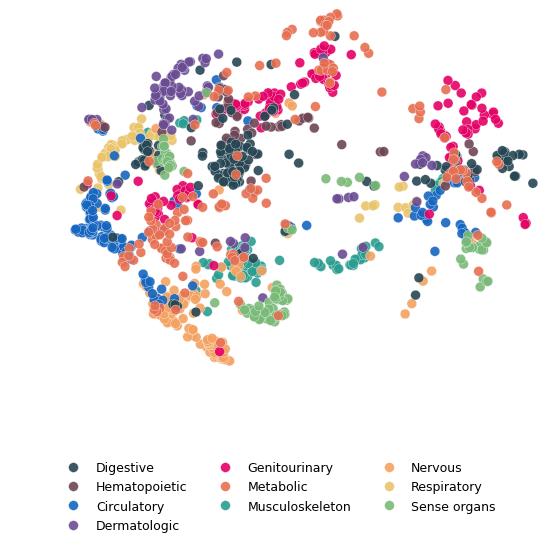

In [17]:
#
# A) organ system phecodes
#

fig, ax = plt.subplots(figsize=(6.25, 6.0))

# CPT + LNC
#sns.scatterplot(embed_df.loc[embed_df['ntype'] != 'PHECODE'].sample(frac=1), x=0, y=1, 
#    color=c_default, alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax, markers=['s','D', '^'], style='ntype')

# musko (1)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'musculoskeletal')], x=0, y=1, hue='category', 
    palette=[c_musko], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# resp (2)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'respiratory')], x=0, y=1, hue='category', 
    palette=[c_resp], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# neuro (3)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'neurological')], x=0, y=1, hue='category', 
    palette=[c_neuro], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# endo
#sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'endocrine/metabolic')], x=0, y=1, hue='category', 
#    palette=[c_endo], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# circ (4)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'circulatory system')], x=0, y=1, hue='category', 
    palette=[c_circ], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# urinary (5)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'genitourinary')], x=0, y=1, hue='category', 
    palette=[c_urinary], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# hem (6)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'hematopoietic')], x=0, y=1, hue='category', 
    palette=[c_hemo], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# sense organs
#sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'sense organs')], x=0, y=1, hue='category', 
#    palette=[c_sense], alpha=0.9, s=50,  linewidth=0.25, edgecolor='white', ax=ax)
# digestive (7)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'digestive')], x=0, y=1, hue='category', 
    palette=[c_digest], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)
# derm (8)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'dermatologic')], x=0, y=1, hue='category', 
    palette=[c_derm], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)

# sense organs (9)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'sense organs')], x=0, y=1, hue='category', 
    palette=[c_sense], alpha=0.9, s=50,  linewidth=0.25, edgecolor='white', ax=ax)

# endo (10)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'endocrine/metabolic')], x=0, y=1, hue='category', 
    palette=[c_endo], alpha=0.9, s=50, linewidth=0.25, edgecolor='white', ax=ax)

# legend
handles, labels = ax.get_legend_handles_labels()
legend_order = [x-1 for x in [7, 6, 4, 8, 5, 10, 1, 3, 2, 9]]
new_handles = [handles[idx] for idx in legend_order]

new_labels = ['Digestive', 'Hematopoietic', 'Circulatory',
             'Dermatologic', 'Genitourinary', 'Metabolic', 'Musculoskeleton', 'Nervous', 'Respiratory',
             'Sense organs']
ax.legend(new_handles, new_labels)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.45), ncol=3, title=None, frameon=False,
    fontsize=9
)

plt.ylim(-3, 13.5)
plt.xlim(-6, 12)

#loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True, left=True, bottom=True)

#plt.xlabel("UMAP 1")
#plt.ylabel("UMAP 2")

plt.tight_layout()
plt.axis('off')

In [18]:
fig.savefig("umap_phecode.svg", dpi=300)

## ATC codes

(-6.0, 12.0, -3.0, 13.5)

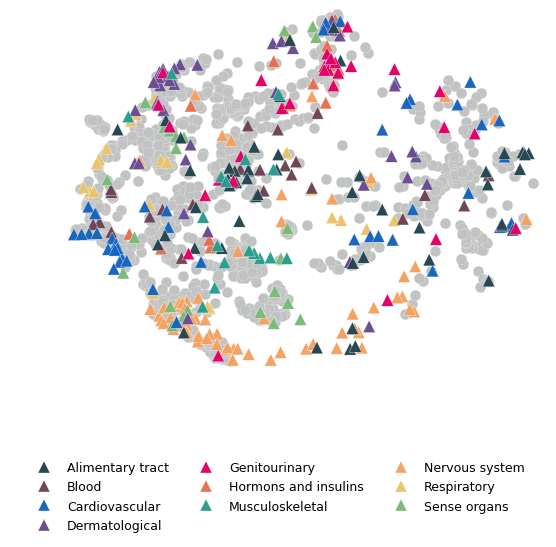

In [15]:
#
# B) ATC
#
fig, ax = plt.subplots(figsize=(6.25, 6.0))

# phecode background
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'].isin(['endocrine/metabolic',
       'hematopoietic', 'mental disorders', 'neurological',
       'sense organs',  'digestive',
       'genitourinary', 'dermatologic', 'respiratory', 'circulatory system',
       'musculoskeletal']))], x=0, y=1,
    color="#C1C2C2", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white')

#######

# resp (0)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'R')], x=0, y=1, hue='category', 
    palette=[c_resp], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# neuro (1)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'N')], x=0, y=1, hue='category', 
    palette=[c_neuro], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# endo (2)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['H']))], x=0, y=1, hue='category', 
    palette=[c_endo], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# hemo (3)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['B']))], x=0, y=1, hue='category', 
    palette=[c_hemo], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# sense (4)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['S']))], x=0, y=1, hue='category', 
    palette=[c_sense], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# derm (5)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'D')], x=0, y=1, hue='category', 
    palette=[c_derm], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# circ (6)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['C']))], x=0, y=1, hue='category', 
    palette=[c_circ], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# digestive (7)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'A')], x=0, y=1, hue='category', 
    palette=[c_digest], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# urinary (8)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['G']))], x=0, y=1, hue='category', 
    palette=[c_urinary], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)
# musko (9)
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'M')], x=0, y=1, hue='category', 
    palette=[c_musko], marker='^', alpha=0.99, s=80, linewidth=0.25, edgecolor='white', ax=ax)

handles, labels = ax.get_legend_handles_labels()
legend_order = [x+0 for x in [7, 3, 6, 5, 8, 2, 9, 1, 0, 4]]
new_handles = [handles[idx] for idx in legend_order]

new_labels = ["Alimentary tract", "Blood", 'Cardiovascular', "Dermatological",
           "Genitourinary", "Hormons and insulins", "Musculoskeletal", 
           "Nervous system", "Respiratory", 
            "Sense organs"]
ax.legend(new_handles, new_labels)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.45), ncol=3, title=None, frameon=False,
    fontsize=9
)

plt.ylim(-3, 13.5)
plt.xlim(-6, 12)

#loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True, left=True, bottom=True)

#plt.xlabel("UMAP 1")
#plt.ylabel("UMAP 2")
plt.tight_layout()
plt.axis('off')

In [16]:
fig.savefig("umap_atc.svg", dpi=300)

## CPT and LNC codes

### Lupus

In [7]:
# Lupus
node_map_df.query("node_id == '695.42'")

,ntype,node_name,node_id,global_graph_index
931,PHECODE,Systemic lupus erythematosus,695.42,25595


In [ ]:
cos_list = []
disease_ind = 25595
for i, row in embed_df.iterrows():
    cpt_ind = row['global_graph_index']
    d = cos(h_graph[disease_ind], h_graph[cpt_ind])
    cos_list.append(d.item())
embed_df['cos'] = cos_list

In [105]:
node_map_df.query("node_id == 'LP15088-5'")

,ntype,node_name,node_id,global_graph_index
55356,LNC,Lymphocytes B,LP15088-5,22785


In [124]:
highlight_inds = [632, 24028, 507, 22075, 506, 23254, 23255, 
                  21433, 86141, 16786,
                  22075, 18404, 356, 193, 870,
                   85004 , 22785, 16588, 23284]
# antinuclear ab, urine, sed rate(cpt), sed rate(lnc), sed (cpt)
#   phospholipid, phospholipid, ribonuclear, comp factor H, comp C4, comp 3
#   C-protein, C-protein (cpt), Erythrocyte, Erythrocyte width, Eryth mcv,
# Prothrombin, PROTHROMBIN TIME, biopsy of kidney, muscle biopsy

In [117]:
node_map_df.loc[node_map_df['node_name'].str.contains('Platelet')]

,ntype,node_name,node_id,global_graph_index
54107,CPT,Platelet function test,85576,917
9343,ICD9CM,Platelet transfusion,99.05,8101
18819,LNC,Platelet aggr,LP6452-9,18398
18866,LNC,Platelets.large,LA11172-6,18445
18877,LNC,Platelet glycoprotein,LP36439-5,18456
21399,LNC,Platelet factor,LP30937-4,20978
55150,LNC,Platelet,LP16772-3,23284
56682,LNC,Platelet Ab,LP28760-4,23285
56683,LNC,Platelet associated Ab,LP39431-9,23286
56648,LNC,Platelet clump,LA11168-4,23287


(-5.0, 14.0, -5.0, 15.0)

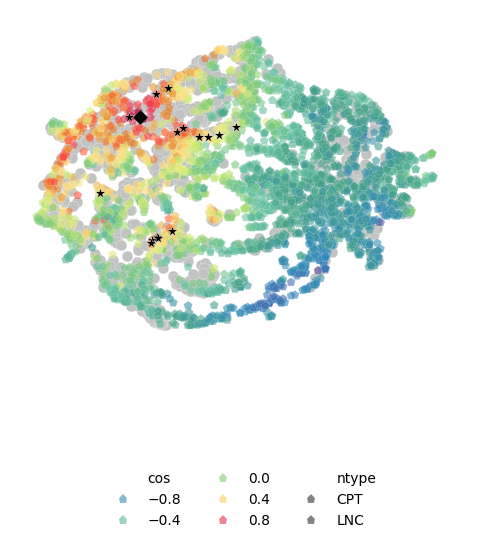

In [125]:
fig, ax = plt.subplots(figsize=(6, 4.75))

# phecode background
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE')], x=0, y=1,
    color="#C1C2C2", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white')

import matplotlib.colors

norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#5e4fa2"], # purple
          [norm(-0.9), "#3288bd"], # blue 
          [norm(-0.6), "#47a386"], # deeper green
          [norm(-0.3), "#66c2a5"], # green
            [norm(0.0), "#80cb75"], # light green
          [norm(0.2), "#dbf070"], # yellow (muted)
          [norm( 0.3), "#fee08b"], # yellow 
          [norm( 0.4), "#ffd86a"], # brighter yellow
          [norm(0.55), "#df8329"], # lighter orange
          [norm( 0.65), "#ff6232"], # bright orange
          [norm(0.8), "#fa3c51"], # coral red
          [norm(1.0), "#9e0142"]] # dark red

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
#cmap="Spectral_r"

# phecodes
sns.scatterplot(embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, s=45, ax=ax, 
                hue='cos', palette=cmap, linewidth=0.15, style='ntype',
                edgecolor='white', markers=['p', 'p'], alpha=0.6)

# add disease point
sns.scatterplot(embed_df.loc[(embed_df['global_graph_index'] == disease_ind)], x=0, y=1,
    color="black", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white', marker='D')

# highlight inds
sns.scatterplot(embed_df.loc[(embed_df['global_graph_index'].isin(highlight_inds))], x=0, y=1,
    color="black", alpha=1.0, linewidth=0.25, s=60, ax=ax, edgecolor='white', marker='*')


sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.45), ncol=3, title=None, frameon=False
)

plt.ylim(-5, 15)
plt.xlim(-5, 14)

#loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True, left=True, bottom=True)

#plt.xlabel("UMAP 1")
#plt.ylabel("UMAP 2")

plt.axis('off')


In [126]:
fig_2d = px.scatter(
    embed_df.loc[embed_df['global_graph_index'].isin(highlight_inds)], x=0, y=1, color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=500,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [35]:
fig_2d = px.scatter(
    embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=500,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [127]:
fig.savefig("umap_lupus.svg", dpi=300)

### Grave's disease

In [8]:
# Graves
node_map_df.query("node_id == '242.1'")

,ntype,node_name,node_id,global_graph_index
4705,ICD9CM,Toxic uninodular goiter,242.1,3463
159,PHECODE,Graves' disease,242.1,24436


In [6]:
cos_list = []
disease_ind = 24436
for i, row in embed_df.iterrows():
    cpt_ind = row['global_graph_index']
    d = cos(h_graph[disease_ind], h_graph[cpt_ind])
    cos_list.append(d.item())
embed_df['cos'] = cos_list

In [12]:
node_map_df.query("node_id == 'LP16266-6'")

,ntype,node_name,node_id,global_graph_index
55950,LNC,Propranolol,LP16266-6,23377


In [11]:
embed_df.loc[embed_df['node_name'].str.contains('S01')]

,0,1,node_name,node_id,ntype,category,global_graph_index,cos
5429,0.611427,7.620352,ATC4_S01AA,S01AA,ATC4,S,67079,0.005155
5430,0.891714,6.741435,ATC4_S01AD,S01AD,ATC4,S,67080,0.164561
5431,1.005066,7.565347,ATC4_S01AE,S01AE,ATC4,S,67081,-0.185138
5432,0.664138,10.336138,ATC4_S01AX,S01AX,ATC4,S,67082,0.092392
5433,4.500375,13.724535,ATC4_S01BA,S01BA,ATC4,S,67083,0.625755
5434,0.589311,10.511412,ATC4_S01BC,S01BC,ATC4,S,67084,0.115930
5435,5.479931,14.015581,ATC4_S01CB,S01CB,ATC4,S,67085,0.675279
5436,-1.911124,6.548997,ATC4_S01EA,S01EA,ATC4,S,67086,0.227524
5437,-0.603241,0.823954,ATC4_S01EB,S01EB,ATC4,S,67087,0.347231
5438,2.696257,0.291250,ATC4_S01EC,S01EC,ATC4,S,67088,0.632385


In [12]:
highlight_inds = [159, 160, 208, 936, 157, 23847, 23848, 67, 22651, 
                  21862, 22122, 22378, 67089]

In [13]:
node_map_df.loc[node_map_df['global_graph_index'].isin(highlight_inds)]

,ntype,node_name,node_id,global_graph_index
1255,CPT,Fine Needle Aspiration Biopsy Procedures,1035129,67
1345,CPT,ASSAY OF THYROGLOBULIN,84432,157
1347,CPT,Diagnostic Ultrasound Procedures,1010759,159
1348,CPT,Diagnostic ultrasound procedure,76999,160
1396,CPT,ASSAY OF THYROID STIMULATING HORMONE TSH,84443,208
54133,CPT,"Thyroid hormone, T3 measurement",84480,936
56099,LNC,Date of last eye examination,LP94639-9,21862
55234,LNC,Eye,LP117007-7,22122
56036,LNC,Have you ever had double vision,LP117818-7,22378
56031,LNC,Iodine intake,LP203253-2,22651


(-5.0, 14.0, -5.0, 15.0)

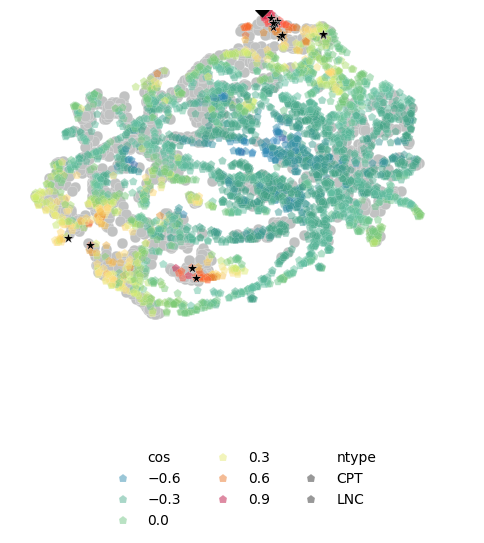

In [14]:
fig, ax = plt.subplots(figsize=(6, 4.75))

# phecode background
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE')], x=0, y=1,
    color="#C1C2C2", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white')

import matplotlib.colors

norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#5e4fa2"], # purple
          [norm(-0.9), "#3288bd"], # blue 
          [norm(-0.6), "#47a386"], # deeper green
          [norm(-0.3), "#66c2a5"], # green
            [norm(0.0), "#80cb75"], # light green
          [norm(0.2), "#dbf070"], # yellow (muted)
          [norm( 0.3), "#fee08b"], # yellow 
          [norm( 0.4), "#ffd86a"], # brighter yellow
          [norm(0.55), "#df8329"], # lighter orange
          [norm( 0.65), "#ff6232"], # bright orange
          [norm(0.8), "#fa3c51"], # coral red
          [norm(1.0), "#9e0142"]] # dark red

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
#cmap="Spectral_r"

# phecodes
sns.scatterplot(embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, s=40, ax=ax, 
                hue='cos', palette=cmap, linewidth=0.15, style='ntype',
                edgecolor='white', markers=['p', 'p'], alpha=0.5)

# add disease point
sns.scatterplot(embed_df.loc[(embed_df['global_graph_index'] == disease_ind)], x=0, y=1,
    color="black", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white', marker='D')

# highlight inds
sns.scatterplot(embed_df.loc[(embed_df['global_graph_index'].isin(highlight_inds))], x=0, y=1,
    color="black", alpha=1.0, linewidth=0.25, s=60, ax=ax, edgecolor='white', marker='*')

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.45), ncol=3, title=None, frameon=False
)

plt.ylim(-5, 15)
plt.xlim(-5, 14)

#loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True, left=True, bottom=True)

#plt.xlabel("UMAP 1")
#plt.ylabel("UMAP 2")

plt.axis('off')

In [19]:
fig_2d = px.scatter(
    embed_df, x=0, y=1, color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=500,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [13]:
fig_2d = px.scatter(
    embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=500,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [15]:
fig.savefig("umap_graves.svg", dpi=300)

### MS

In [65]:
# Graves
node_map_df.query("node_id == '335.0'")

,ntype,node_name,node_id,global_graph_index
7140,ICD9CM,Werdnig-Hoffmann disease,335.0,5898
2176,PHECODE,Multiple sclerosis,335.0,24762


In [66]:
cos_list = []
disease_ind = 24762
for i, row in embed_df.iterrows():
    cpt_ind = row['global_graph_index']
    d = cos(h_graph[disease_ind], h_graph[cpt_ind])
    cos_list.append(d.item())
embed_df['cos'] = cos_list

(-5.0, 14.0, -5.0, 15.0)

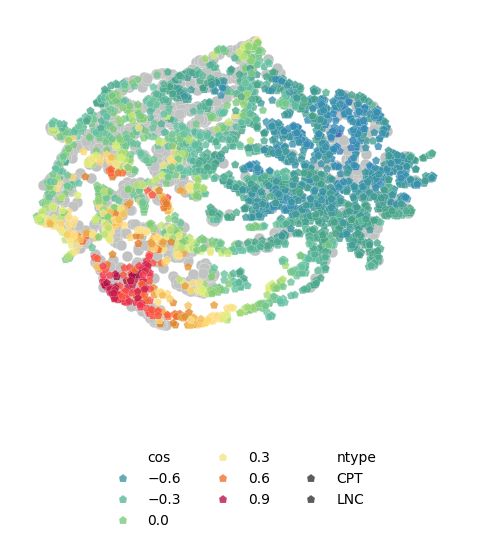

In [67]:
fig, ax = plt.subplots(figsize=(6, 4.75))

# phecode background
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE')], x=0, y=1,
    color="#C1C2C2", alpha=1.0, linewidth=0.15, s=60, ax=ax, edgecolor='white')

import matplotlib.colors

norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#5e4fa2"], # purple
          [norm(-0.9), "#3288bd"], # blue 
          [norm(-0.6), "#47a386"], # deeper green
          [norm(-0.3), "#66c2a5"], # green
            [norm(0.0), "#80cb75"], # light green
          [norm(0.2), "#dbf070"], # yellow (muted)
          [norm( 0.3), "#fee08b"], # yellow 
          [norm( 0.4), "#ffd86a"], # brighter yellow
          [norm(0.55), "#df8329"], # lighter orange
          [norm( 0.65), "#ff6232"], # bright orange
          [norm(0.8), "#fa3c51"], # coral red
          [norm(1.0), "#9e0142"]] # dark red

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)
#cmap="Spectral_r"

# phecodes
sns.scatterplot(embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, s=40, ax=ax, 
                hue='cos', palette=cmap, linewidth=0.15, style='ntype',
                edgecolor='white', markers=['p', 'p'], alpha=0.8)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.45), ncol=3, title=None, frameon=False
)

plt.ylim(-5, 15)
plt.xlim(-5, 14)

#loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True, left=True, bottom=True)

#plt.xlabel("UMAP 1")
#plt.ylabel("UMAP 2")

plt.axis('off')


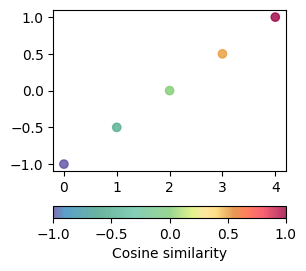

In [87]:
import matplotlib

norm = matplotlib.colors.Normalize(-1,1)
import matplotlib.colors

norm = matplotlib.colors.Normalize(-1,1)
colors = [[norm(-1.0), "#5e4fa2"], # purple
          [norm(-0.9), "#3288bd"], # blue 
          [norm(-0.6), "#47a386"], # deeper green
          [norm(-0.3), "#66c2a5"], # green
            [norm(0.0), "#80cb75"], # light green
          [norm(0.2), "#dbf070"], # yellow (muted)
          [norm( 0.3), "#fee08b"], # yellow 
          [norm( 0.4), "#ffd86a"], # brighter yellow
          [norm(0.55), "#df8329"], # lighter orange
          [norm( 0.65), "#ff6232"], # bright orange
          [norm(0.8), "#fa3c51"], # coral red
          [norm(1.0), "#9e0142"]] # dark red

cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

fig, ax=plt.subplots(figsize=(3,3))
x = np.arange(5)
y = np.linspace(-1,1,5)
sc = ax.scatter(x,y, c=y, norm=norm, cmap=cmap, alpha=0.8)
fig.colorbar(sc, orientation="horizontal", alpha=0.6, label="Cosine similarity")
plt.show()

In [88]:
fig.savefig("umap_colorbar.svg", dpi=300)

In [68]:
fig_2d = px.scatter(
    embed_df.loc[embed_df['ntype'].isin(['CPT', 'LNC'])], x=0, y=1, color='cos',
hover_data=["node_name", "node_id"], hover_name="node_name"
)
# hover name
fig_2d.update_layout(
    width=500,
    height=500,
)
fig_2d.update_traces(opacity=.9)
fig_2d.show()

In [20]:
fig.savefig("umap_ms.svg", dpi=300)

### Other

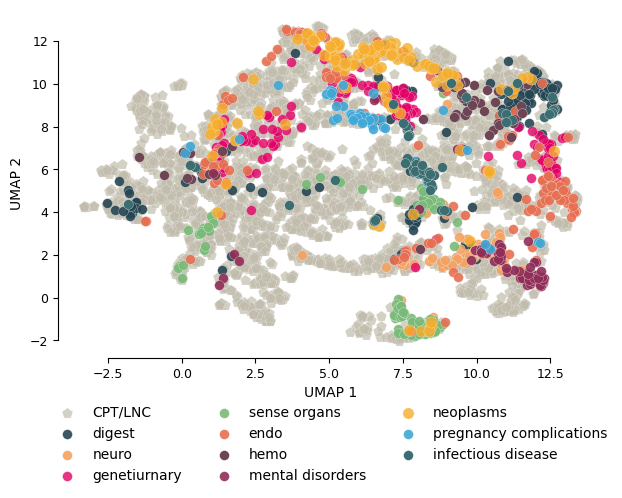

In [163]:
fig, ax = plt.subplots(figsize=(7, 4.5))

# CPT/LNC
sns.scatterplot(embed_df.loc[embed_df['category'].isin(['CPT', 'LNC'])], x=0, y=1, s=65, ax=ax, 
                color="#c1bcac", 
                linewidth=0.2,
                edgecolor='white', marker='p', alpha=0.7, label='CPT/LNC')

# digestive
sns.scatterplot(embed_df.loc[embed_df['category'] == 'digestive'], x=0, y=1, s=50, ax=ax, 
                color=c_digest, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label='digest')

# neuro
sns.scatterplot(embed_df.loc[embed_df['category'] == 'neurological'], x=0, y=1, s=50, ax=ax, 
                color=c_neuro, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label="neuro")

# genitourinary
sns.scatterplot(embed_df.loc[embed_df['category'] == 'genitourinary'], x=0, y=1, s=50, ax=ax, 
                color=c_urinary, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.8, label="genetiurnary")

# sense organs
sns.scatterplot(embed_df.loc[embed_df['category'] == 'sense organs'], x=0, y=1, s=50, ax=ax, 
                color=c_sense, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label='sense organs')

# endocrine/metabolic
sns.scatterplot(embed_df.loc[embed_df['category'] == 'endocrine/metabolic'], x=0, y=1, s=50, ax=ax, 
                color=c_endo, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label='endo')

# hematopoietic
sns.scatterplot(embed_df.loc[embed_df['category'] == 'hematopoietic'], x=0, y=1, s=50, ax=ax, 
                color=c_hemo, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=1, label='hemo')

# mental disorders
sns.scatterplot(embed_df.loc[embed_df['category'] == 'mental disorders'], x=0, y=1, s=50, ax=ax, 
                color=c_mental, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label='mental disorders')

# neoplasms
sns.scatterplot(embed_df.loc[embed_df['category'] == 'neoplasms'], x=0, y=1, s=65, ax=ax, 
                color=c_neo, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.8, label='neoplasms')

# 'pregnancy complications'
sns.scatterplot(embed_df.loc[embed_df['category'] == 'pregnancy complications'], x=0, y=1, s=50, ax=ax, 
                color=c_preg, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=0.9, label='pregnancy complications')

# infectious diseases
sns.scatterplot(embed_df.loc[embed_df['category'] == 'infectious diseases'], x=0, y=1, s=50, ax=ax, 
                color=c_infect, 
                linewidth=0.2,
                edgecolor='white', marker='o', alpha=1, label='infectious disease')


sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.40), ncol=3, title=None, frameon=False
)
plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

sns.despine(top=True, right=True, bottom=False, left=False, ax=ax,
            trim=True, offset=1)

ax.yaxis.set_tick_params(labelsize = 9)
ax.xaxis.set_tick_params(labelsize = 9)


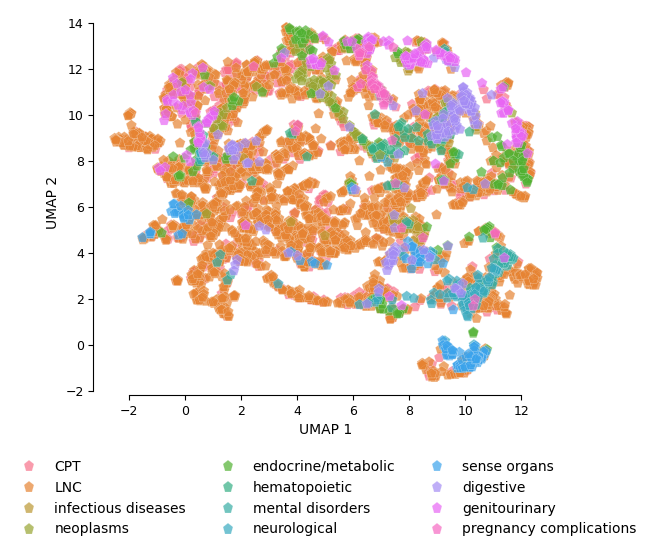

In [91]:
fig, ax = plt.subplots(figsize=(6, 5))

# pehcodes
sns.scatterplot(embed_df, x=0, y=1, s=65, ax=ax, 
                #color="#758694", 
                hue='category',
                linewidth=0.2,
                edgecolor='white', marker='p', alpha=0.7)

#sns.scatterplot(embed_df, x=0, y=1, s=65, ax=ax, 
#                color="none", linewidth=0.2,
#                edgecolor='white', marker='p', alpha=1)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

sns.despine(top=True, right=True, bottom=False, left=False, ax=ax,
            trim=True)

ax.yaxis.set_tick_params(labelsize = 9)
ax.xaxis.set_tick_params(labelsize = 9)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.40), ncol=3, title=None, frameon=False
)

In [164]:
fig.savefig("gradient_plain.svg", dpi=300)

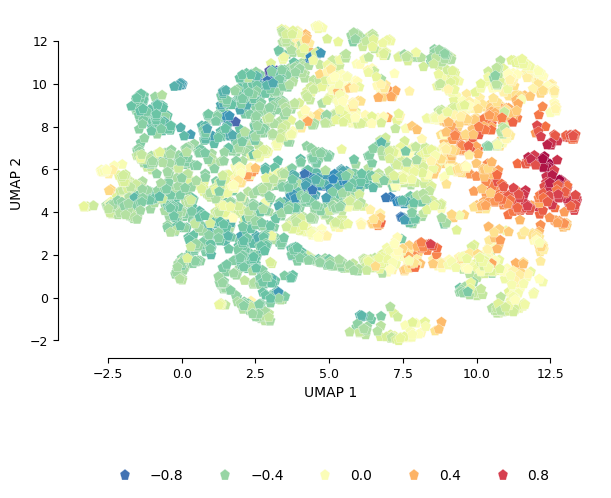

In [161]:
fig, ax = plt.subplots(figsize=(7, 4.5))

# pehcodes
sns.scatterplot(embed_df.loc[embed_df['ntype'] != 'PHECODE'], x=0, y=1, s=65, ax=ax, 
                hue='cos', palette='Spectral_r', linewidth=0.2,
                edgecolor='white', marker='p', alpha=1)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.40), ncol=6, title=None, frameon=False)


plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

sns.despine(top=True, right=True, bottom=False, left=False, ax=ax,
            trim=True, offset=1)

ax.yaxis.set_tick_params(labelsize = 9)
ax.xaxis.set_tick_params(labelsize = 9)


In [162]:
fig.savefig("gradient_lupus.svg", dpi=300)

In [3]:
c_digest = "#264653"
c_musko = "#2a9d8f"
c_derm = "#6a4c93"
c_resp = "#e9c46a"
c_neuro='#f4a261'
c_endo="#e76f51"
c_circ="#1565c0"
c_urinary='#ef476f'
c_hemo="#E2BBE9"
c_sense='#7ABA78'
c_infec='brown'
c_default="#DDDDDD"

In [ ]:
#
# B) CPT
#
fig, ax = plt.subplots(figsize=(6.5, 6))

# pehcodes
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE')], x=0, y=1,
    color=c_default, alpha=0.6, s=50, ax=ax)

#######

# digestive
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'] == 'cpt_digest')], x=0, y=1, hue='category', 
    palette=[c_digest], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# resp
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'] == 'cpt_resp')], x=0, y=1, hue='category', 
    palette=[c_resp], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# neuro
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'] == 'cpt_nervous')], x=0, y=1, hue='category', 
    palette=[c_neuro], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# endo
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'].isin(['cpt_endo']))], x=0, y=1, hue='category', 
    palette=[c_endo], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# hemo
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'].isin(['cpt_hemo']))], x=0, y=1, hue='category', 
    palette=[c_hemo], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# urinary
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'].isin(['cpt_urinary']))], x=0, y=1, hue='category', 
    palette=[c_urinary], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# musko
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'] == 'cpt_musko')], x=0, y=1, hue='category', 
    palette=[c_musko], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# derm
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'] == 'cpt_derm')], x=0, y=1, hue='category', 
    palette=[c_derm], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# sense
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'].isin(['cpt_sense']))], x=0, y=1, hue='category', 
    palette=[c_sense], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)
# circ
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'CPT') & (embed_df['category'].isin(['cpt_cardio']))], x=0, y=1, hue='category', 
    palette=[c_circ], marker='s', alpha=0.99, s=70, linewidth=0.5, edgecolor='white', ax=ax)

# legend
handles, labels = ax.get_legend_handles_labels()
legend_order = [0, 4, 8, 6, 7, 3, 9, 2, 1, 5]
new_handles = [handles[idx] for idx in legend_order]

#new_labels = ["Alimentary tract", "Blood", 'Cardiovascular', "Dermatological",
#           "Genitourinary", "Hormons and insulins", "Musculoskeletal", "Nervous system", "Respiratory", 
#            "Sense organs"]
#ax.legend(new_handles, new_labels)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.40), ncol=3, title=None, frameon=False
)
sns.despine(offset=0, trim=True)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

Text(0, 0.5, 'UMAP 2')

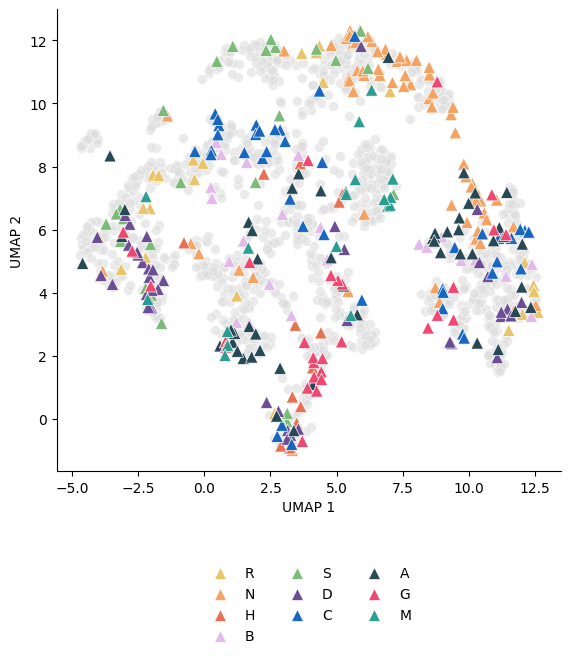

In [144]:
#
# B) ATC
#
fig, ax = plt.subplots(figsize=(6.5, 6))

# pehcodes
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE')], x=0, y=1,
    color=c_default, alpha=0.6, s=50, ax=ax)

#######

# resp
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'R')], x=0, y=1, hue='category', 
    palette=[c_resp], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# neuro
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'N')], x=0, y=1, hue='category', 
    palette=[c_neuro], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# endo
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['H']))], x=0, y=1, hue='category', 
    palette=[c_endo], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# hemo
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['B']))], x=0, y=1, hue='category', 
    palette=[c_hemo], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# sense
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['S']))], x=0, y=1, hue='category', 
    palette=[c_sense], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# derm
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'D')], x=0, y=1, hue='category', 
    palette=[c_derm], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# circ
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['C']))], x=0, y=1, hue='category', 
    palette=[c_circ], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# digestive
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'A')], x=0, y=1, hue='category', 
    palette=[c_digest], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# urinary
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'].isin(['G']))], x=0, y=1, hue='category', 
    palette=[c_urinary], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
# musko
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'ATC4') & (embed_df['category'] == 'M')], x=0, y=1, hue='category', 
    palette=[c_musko], marker='^', alpha=0.99, s=80, linewidth=0.5, edgecolor='white', ax=ax)
    
# legend
#handles, labels = ax.get_legend_handles_labels()
#legend_order = [0, 4, 8, 6, 7, 3, 9, 2, 1, 5]
#new_handles = [handles[idx] for idx in legend_order]

#new_labels = ["Alimentary tract", "Blood", 'Cardiovascular', "Dermatological",
#           "Genitourinary", "Hormons and insulins", "Musculoskeletal", "Nervous system", "Respiratory", 
#            "Sense organs"]
#ax.legend(new_handles, new_labels)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.40), ncol=3, title=None, frameon=False
)
sns.despine(offset=0, trim=False)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

Text(0, 0.5, 'UMAP 2')

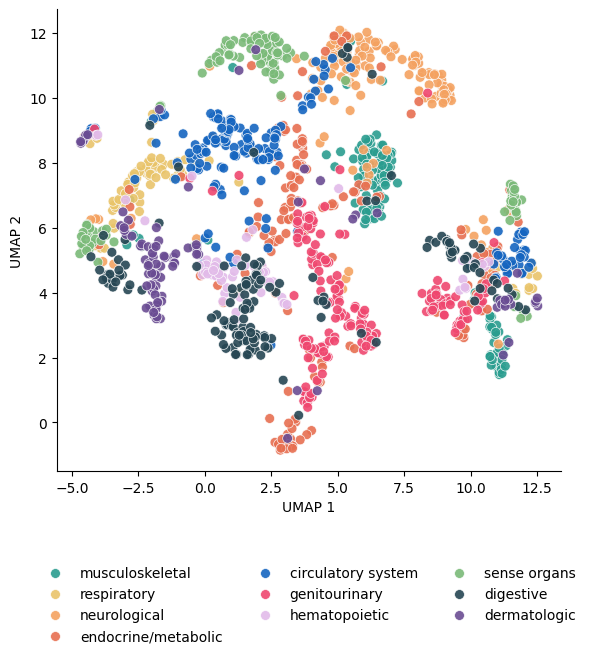

In [146]:
#
# A) organ system phecodes
#

fig, ax = plt.subplots(figsize=(6.5, 6))

# musko
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'musculoskeletal')], x=0, y=1, hue='category', 
    palette=[c_musko], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# resp
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'respiratory')], x=0, y=1, hue='category', 
    palette=[c_resp], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# neuro
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'neurological')], x=0, y=1, hue='category', 
    palette=[c_neuro], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# endo
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'endocrine/metabolic')], x=0, y=1, hue='category', 
    palette=[c_endo], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# circ
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'circulatory system')], x=0, y=1, hue='category', 
    palette=[c_circ], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# urinary
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'genitourinary')], x=0, y=1, hue='category', 
    palette=[c_urinary], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# hem
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'hematopoietic')], x=0, y=1, hue='category', 
    palette=[c_hemo], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# sense organs
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'sense organs')], x=0, y=1, hue='category', 
    palette=[c_sense], alpha=0.9, s=50,  linewidth=0.5, edgecolor='white', ax=ax)
# digestive
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'digestive')], x=0, y=1, hue='category', 
    palette=[c_digest], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)
# derm
sns.scatterplot(embed_df.loc[(embed_df['ntype'] == 'PHECODE') & (embed_df['category'] == 'dermatologic')], x=0, y=1, hue='category', 
    palette=[c_derm], alpha=0.9, s=50, linewidth=0.5, edgecolor='white', ax=ax)

# legend
handles, labels = ax.get_legend_handles_labels()
legend_order = [8, 6, 4, 9, 5, 3, 0, 2, 1, 7]
new_handles = [handles[idx] for idx in legend_order]

new_labels = ['Digestive', 'Hematopoietic', 'Circulatory',
             'Dermatologic', 'Genitourinary', 'Metabolic', 'Musculoskeleton', 'Nervous', 'Respiratory',
             'Sense organs']
#ax.legend(new_handles, new_labels)

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.4), ncol=3, title=None, frameon=False
)
sns.despine(offset=0, trim=False)

plt.xlabel("UMAP 1")
plt.ylabel("UMAP 2")

# Local UMAP

### Digestive

In [66]:
!pwd

/n/home01/ruthjohnson/kg_paper/umap


In [194]:
icd_map_df = pd.read_csv("../construct_kg/phekg/phecode_icd9_map_unrolled.csv")
icd_map_df = icd_map_df.assign(icd9=icd_map_df['icd9'].str.lstrip('0').values)

phecode_df = node_map_df.loc[node_map_df['ntype'] == 'PHECODE']
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(float))
phecode_df = phecode_df.merge(defn_df[['category', 'phecode']], left_on='node_id', right_on='phecode', how='left')
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(str))

joint_map_df = icd_map_df.merge(
    defn_df[['phenotype', 'category', 'phecode']], on='phecode', how='left')
joint_map_df = joint_map_df.loc[joint_map_df['category'].isin(['digestive'])]

In [195]:
digestive_df = node_map_df.loc[(node_map_df['ntype'] == 'ICD9CM') 
                & (node_map_df['node_id'].isin(joint_map_df['icd9'].values))]

digestive_df = digestive_df.merge(joint_map_df[['category','icd9', 'phecode']], left_on='node_id', 
                                  right_on='icd9', how='inner')[['phecode', 'category', 'global_graph_index', 'ntype']].drop_duplicates()

#digestive_df = pd.concat(
#    [phecode_df.loc[phecode_df['category'].isin(['digestive'])],
#      digestive_df]
#    )
digestive_df = phecode_df.loc[phecode_df['category'].isin(['digestive'])]

digestive_df = node_map_df.loc[node_map_df['global_graph_index'].isin(digestive_df['global_graph_index'].values)]

digestive_inds = digestive_df['global_graph_index'].values.tolist()

In [21]:
len(digestive_inds)

158

In [201]:
all_inds = list(set(digestive_inds))
#
# digest_atc_inds

local_embed_mat = h_graph[all_inds].numpy()

local_embed_mat = umap.UMAP(n_components=2, metric='cosine', n_neighbors=10, min_dist=0.5).fit_transform(local_embed_mat)

In [202]:
# add metadata and labels
local_embed_df = pd.DataFrame(local_embed_mat)
diag_df = node_map_df.loc[node_map_df['global_graph_index'].isin(all_inds)]
local_embed_df['node_name'] = diag_df['node_name'].values
local_embed_df['node_id'] = diag_df['node_id'].values
local_embed_df['ntype'] = diag_df['ntype'].values
local_embed_df['global_graph_index'] = diag_df['global_graph_index'].values
local_embed_df['category'] = local_embed_df['node_id'].str.slice(0,2)

joint_map_df = joint_map_df.assign(ntype=['ICD9CM']*len(joint_map_df))
joint_map_df['node_id'] = joint_map_df['icd9'].values 

local_embed_df = local_embed_df.merge(joint_map_df[['phecode', 'ntype', 'node_id', 'icd9']], on=['ntype', 'node_id'], how='left').drop_duplicates()
local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM', 'category'] = local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM']['phecode'].astype(str).str.slice(0,2)
local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE', 'phecode'] = local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE']['node_id'].astype(float)
local_embed_df['phecode'] = local_embed_df['phecode'].astype(float)

In [223]:
local_embed_df.loc[local_embed_df['phecode'].between(520.0, 526.99), 'category'] = 'teeth' #"Disorders of teeth and jaws"
local_embed_df.loc[local_embed_df['phecode'].between(527.0, 529.99), 'category'] = 'mouth' # "Disorders of mouth"
local_embed_df.loc[local_embed_df['phecode'].between(530.0, 530.99), 'category'] = "Esophageal"
local_embed_df.loc[local_embed_df['phecode'].between(532.0, 532.99), 'category'] = "Esophageal"
local_embed_df.loc[local_embed_df['phecode'].between(531.0, 531.99), 'category'] = "Gastro ulcer"

local_embed_df.loc[local_embed_df['phecode'].between(535.0, 537.99), 'category'] = "stomach"
local_embed_df.loc[local_embed_df['phecode'].between(539.0, 539.99), 'category'] = "Bariatric"
local_embed_df.loc[local_embed_df['phecode'].between(540.0, 540.99), 'category'] = "Appendiceal"

local_embed_df.loc[local_embed_df['phecode'].between(578.0, 579.99), 'category'] = "Other"
local_embed_df.loc[local_embed_df['phecode'].between(565.0, 569.99), 'category'] = "Other"
local_embed_df.loc[local_embed_df['phecode'].between(555.0, 564.99), 'category'] = "Noninfective"
local_embed_df.loc[local_embed_df['phecode'].between(550.0, 550.99), 'category'] = "hernia"
local_embed_df.loc[local_embed_df['phecode'].between(570.0, 573.99), 'category'] = "Liver"
local_embed_df.loc[local_embed_df['phecode'].between(574, 576.99), 'category'] = "Biliary"
local_embed_df.loc[local_embed_df['phecode'].between(578.0, 579.99), 'category'] = "Other"
local_embed_df.loc[local_embed_df['phecode'].between(577, 577.99), 'category'] = "Pancreatic"

In [182]:
teeth_inds = local_embed_df.loc[local_embed_df['category'].isin(['teeth', 'mouth'])]['global_graph_index'].values

In [183]:
keep_inds = local_embed_df.loc[local_embed_df['category'].isin(keep_cat)]['global_graph_index'].values

In [184]:
count_df = local_embed_df.groupby('category').count().reset_index()
keep_cat = count_df.loc[count_df[0] >= 5]['category'].values

In [219]:
fig_2d = px.scatter(
        local_embed_df, x=0, y=1, color="category",
    hover_name="node_name", hover_data=['node_name', 'node_id']
    )

# hover name
fig_2d.update_layout(
    width=700,
    height=600,
)
fig_2d.update_traces(opacity=.7)
fig_2d.show()

Text(0.5, 1.0, 'Teeth and mouth disorders')

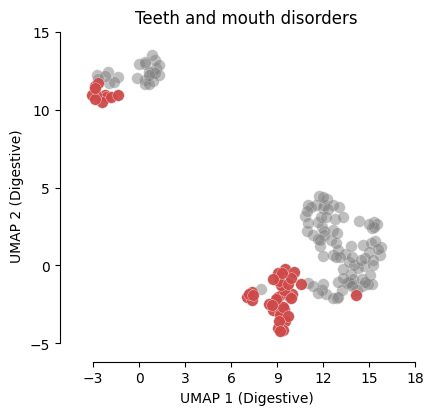

In [268]:
fig, ax = plt.subplots(figsize=(4.75, 4.25))

sns.scatterplot(local_embed_df, 
                x=0, y=1, alpha=0.5, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='gray'
#                palette=["#9d8df1", "#00b2ca", "#81f7e5", "#fae588", "#48cae4",
#                "#ffa69e", "#ffba78", "#ee7674", "#e0aaff", "#eb7bc0", "#90cf8e"]
)

sns.scatterplot(local_embed_df.loc[local_embed_df['category'].isin(['teeth', 'mouth'])], 
                x=0, y=1, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='#D04848'
)

plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

#sns.move_legend(
#    ax, "lower center",
#    bbox_to_anchor=(.5, -0.5), ncol=3, title=None, frameon=False
#)

plt.xlim(-5, 19)
plt.ylim(-6, 15)

loc = plticker.MultipleLocator(base=5.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)

loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
ax.xaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True)

plt.title("Teeth and mouth disorders")

In [269]:
fig.savefig("local_teeth.svg", dpi=300)

Text(0.5, 1.0, 'Biliary system')

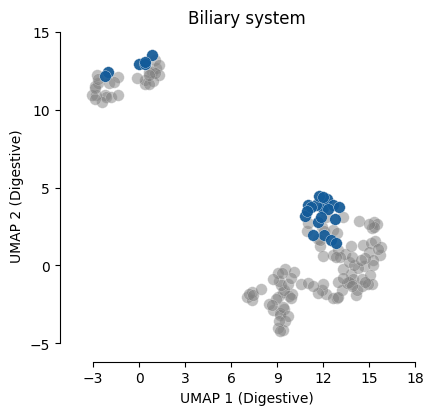

In [270]:
fig, ax = plt.subplots(figsize=(4.75, 4.25))

sns.scatterplot(local_embed_df, 
                x=0, y=1, alpha=0.5, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='gray'
#                palette=["#9d8df1", "#00b2ca", "#81f7e5", "#fae588", "#48cae4",
#                "#ffa69e", "#ffba78", "#ee7674", "#e0aaff", "#eb7bc0", "#90cf8e"]
)

sns.scatterplot(local_embed_df.loc[local_embed_df['category'].isin(['Liver', 'Biliary'])], 
                x=0, y=1, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='#125B9A'
)

plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

plt.xlim(-5, 19)
plt.ylim(-6, 15)

loc = plticker.MultipleLocator(base=5.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)

loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
ax.xaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True)

plt.title("Biliary system")

In [271]:
fig.savefig("local_biliary.svg", dpi=300)

Text(0.5, 1.0, 'Functional digestive disorders')

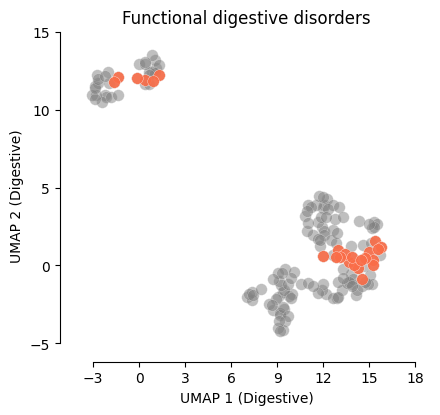

In [272]:
fig, ax = plt.subplots(figsize=(4.75, 4.25))

sns.scatterplot(local_embed_df, 
                x=0, y=1, alpha=0.5, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='gray'
#                palette=["#9d8df1", "#00b2ca", "#81f7e5", "#fae588", "#48cae4",
#                "#ffa69e", "#ffba78", "#ee7674", "#e0aaff", "#eb7bc0", "#90cf8e"]
)

sns.scatterplot(local_embed_df.loc[local_embed_df['category'].isin(['Noninfective'])], 
                x=0, y=1, alpha=0.9, s=70, linewidth=0.25, edgecolor='white', ax=ax,
                color='#FB6D48'
)

sns.despine(offset=0, trim=False)

plt.xlabel("UMAP 1 (Digestive)")
plt.ylabel("UMAP 2 (Digestive)")

plt.xlim(-5, 19)
plt.ylim(-6, 15)

loc = plticker.MultipleLocator(base=5.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
ax.yaxis.set_major_locator(loc)

loc = plticker.MultipleLocator(base=3.0) # this locator puts ticks at regular intervals
ax.xaxis.set_major_locator(loc)

sns.despine(offset=2, trim=True)

plt.title("Functional digestive disorders")

In [273]:
fig.savefig("local_functional.svg", dpi=300)

In [221]:
local_embed_df['category'].unique()

array(['teeth', 'mouth', 'Esophageal', 'Gastro ulcer', 'stomach',
       'Bariatric', 'Appendiceal', 'hernia', 'Noninfective', 'Other',
       'Liver', 'Biliary ', 'Pancreatic'], dtype=object)

In [105]:
fig.savefig("local_digestive.svg", dpi=300)

### Nervous system

In [51]:
icd_map_df = pd.read_csv("../construct_kg/phekg/phecode_icd9_map_unrolled.csv")
icd_map_df = icd_map_df.assign(icd9=icd_map_df['icd9'].str.lstrip('0').values)

phecode_df = node_map_df.loc[node_map_df['ntype'] == 'PHECODE']
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(float))
phecode_df = phecode_df.merge(defn_df[['category', 'phecode']], left_on='node_id', right_on='phecode', how='left')
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(str))

joint_map_df = icd_map_df.merge(
    defn_df[['phenotype', 'category', 'phecode']], on='phecode', how='left')
joint_map_df = joint_map_df.loc[joint_map_df['category'].isin(['mental disorders', 'neurological'])]

In [52]:
digestive_df = node_map_df.loc[(node_map_df['ntype'] == 'ICD9CM') 
                & (node_map_df['node_id'].isin(joint_map_df['icd9'].values))]

digestive_df = digestive_df.merge(joint_map_df[['category','icd9', 'phecode']], left_on='node_id', 
                                  right_on='icd9', how='inner')[['phecode', 'category', 'global_graph_index', 'ntype']].drop_duplicates()

#digestive_df = pd.concat(
#    [phecode_df.loc[phecode_df['category'].isin(['mental disorders', 'neurological'])],
#      digestive_df]
#    )

digestive_df = phecode_df.loc[phecode_df['category'].isin(['mental disorders', 'neurological'])]

digestive_df = node_map_df.loc[node_map_df['global_graph_index'].isin(digestive_df['global_graph_index'].values)]

digestive_inds = digestive_df['global_graph_index'].values.tolist()

In [57]:
local_embed_mat = h_graph[digestive_inds].numpy()

local_embed_mat = umap.UMAP(n_components=2, metric='cosine', n_neighbors=5, min_dist=0.1).fit_transform(local_embed_mat)

In [58]:
# add metadata and labels
local_embed_df = pd.DataFrame(local_embed_mat)
diag_df = node_map_df.loc[node_map_df['global_graph_index'].isin(digestive_inds)]
local_embed_df['node_name'] = diag_df['node_name'].values
local_embed_df['node_id'] = diag_df['node_id'].values
local_embed_df['ntype'] = diag_df['ntype'].values
local_embed_df['global_graph_index'] = diag_df['global_graph_index'].values
local_embed_df['category'] = local_embed_df['node_id'].str.slice(0,2)

joint_map_df = joint_map_df.assign(ntype=['ICD9CM']*len(joint_map_df))
joint_map_df['node_id'] = joint_map_df['icd9'].values 

local_embed_df = local_embed_df.merge(joint_map_df[['phecode', 'ntype', 'node_id', 'icd9']], on=['ntype', 'node_id'], how='left').drop_duplicates()
local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM', 'category'] = local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM']['phecode'].astype(str).str.slice(0,2)
local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE', 'phecode'] = local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE']['node_id'].astype(float)
local_embed_df['phecode'] = local_embed_df['phecode'].astype(float)

In [59]:
local_embed_df.loc[local_embed_df['phecode'].between(290, 292.99), 'category'] = 'dementia'
local_embed_df.loc[local_embed_df['phecode'].between(295, 306.99), 'category'] = 'psychological' # "Disorders of mouth"
local_embed_df.loc[local_embed_df['phecode'].between(293, 293.99), 'category'] = "head/neck symptoms"
local_embed_df.loc[local_embed_df['phecode'].between(316, 319.99), 'category'] = "substance"
local_embed_df.loc[local_embed_df['phecode'].between(312, 315.99), 'category'] = "behavioral"

local_embed_df.loc[local_embed_df['phecode'].between(320, 326.9), 'category'] = "inflamatory CNS"
local_embed_df.loc[local_embed_df['phecode'].between(327, 328.99), 'category'] = "sleep"
local_embed_df.loc[local_embed_df['phecode'].between(330, 337.99), 'category'] = "hereditary CNS"

local_embed_df.loc[local_embed_df['phecode'].between(341, 349.99), 'category'] = "hereditary CNS"
local_embed_df.loc[local_embed_df['phecode'].between(338, 338.9), 'category'] = "pain"
local_embed_df.loc[local_embed_df['phecode'].between(339, 340.99), 'category'] = "headache"
local_embed_df.loc[local_embed_df['phecode'].between(351, 355.99), 'category'] = "nerve lessions"
local_embed_df.loc[local_embed_df['phecode'].between(356, 359.99), 'category'] = "peripheral"
local_embed_df.loc[local_embed_df['phecode'].between(350, 350.99), 'category'] = "reflex symptoms "
local_embed_df.loc[local_embed_df['phecode'].between(578.0, 579.99), 'category'] = "Other"
local_embed_df.loc[local_embed_df['phecode'].between(577, 577.99), 'category'] = "Pancreatic"

In [60]:
fig_2d = px.scatter(
        local_embed_df.loc[local_embed_df['category'] != 'other'], x=0, y=1, color="category",
    hover_name="node_name", hover_data=['node_name', 'node_id']
    )

# hover name
fig_2d.update_layout(
    width=650,
    height=600,
)
fig_2d.update_traces(opacity=.7)
fig_2d.show()

In [62]:
count_df = local_embed_df.groupby('category').count().reset_index()
keep_cat = count_df.loc[count_df[0] >= 5]['category'].values

/tmp/ipykernel_184306/2574416429.py:3: UserWarning:

The palette list has more values (14) than needed (10), which may not be intended.



Text(0, 0.5, 'UMAP 2 (Nervous sys.)')

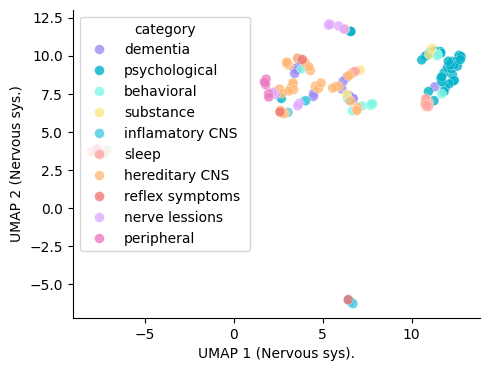

In [64]:
fig, ax = plt.subplots(figsize=(5.25, 4))

sns.scatterplot(local_embed_df.loc[local_embed_df['category'].isin(keep_cat)], 
                x=0, y=1, hue='category', alpha=0.8, s=50, linewidth=0.25, 
                edgecolor='white', ax=ax, marker='o',
                palette=["#9d8df1", "#00b2ca", "#81f7e5", "#fae588", "#48cae4",
                "#ffa69e", "#ffba78", "#ee7674", "#e0aaff", "#eb7bc0", "#90cf8e",
                "#7a82ab", "#90d7ff", "#71f79f"])

sns.despine(offset=0, trim=False)

plt.xlabel("UMAP 1 (Nervous sys).")
plt.ylabel("UMAP 2 (Nervous sys.)")

#sns.move_legend(
#    ax, "lower center",
#    bbox_to_anchor=(.5, -0.5), ncol=3, title=None, frameon=False
#)
#plt.xlim(4, 25)

#loc = plticker.MultipleLocator(base=10.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)

In [23]:
fig.savefig("local_nervous.svg", dpi=300)

### genitourinary

In [186]:
icd_map_df = pd.read_csv("../construct_kg/phekg/phecode_icd9_map_unrolled.csv")
icd_map_df = icd_map_df.assign(icd9=icd_map_df['icd9'].str.lstrip('0').values)

phecode_df = node_map_df.loc[node_map_df['ntype'] == 'PHECODE']
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(float))
phecode_df = phecode_df.merge(defn_df[['category', 'phecode']], left_on='node_id', right_on='phecode', how='left')
phecode_df = phecode_df.assign(node_id=phecode_df['node_id'].astype(str))

joint_map_df = icd_map_df.merge(
    defn_df[['phenotype', 'category', 'phecode']], on='phecode', how='left')
joint_map_df = joint_map_df.loc[joint_map_df['category'].isin(['genitourinary'])]

In [187]:
digestive_df = node_map_df.loc[(node_map_df['ntype'] == 'ICD9CM') 
                & (node_map_df['node_id'].isin(joint_map_df['icd9'].values))]

digestive_df = digestive_df.merge(joint_map_df[['category','icd9', 'phecode']], left_on='node_id', 
                                  right_on='icd9', how='inner')[['phecode', 'category', 'global_graph_index', 'ntype']].drop_duplicates()

#digestive_df = pd.concat(
#    [phecode_df.loc[phecode_df['category'].isin(['genitourinary'])],
#      digestive_df]
#    )

digestive_df = phecode_df.loc[phecode_df['category'].isin(['genitourinary'])]

digestive_df = node_map_df.loc[node_map_df['global_graph_index'].isin(digestive_df['global_graph_index'].values)]

digestive_inds = digestive_df['global_graph_index'].values.tolist()

In [188]:
local_embed_mat = h_graph[digestive_inds].numpy()

local_embed_mat = umap.UMAP(n_components=2, metric='cosine', n_neighbors=15, min_dist=0.7).fit_transform(local_embed_mat)

In [189]:
digestive_df

,ntype,node_name,node_id,global_graph_index
21707,PHECODE,Nephritis; nephrosis; renal sclerosis,580.0,25345
21780,PHECODE,Glomerulonephritis,580.1,25346
766,PHECODE,Proliferative glomerulonephritis,580.11,25347
767,PHECODE,Non-proliferative glomerulonephritis,580.12,25348
768,PHECODE,"Acute glomerulonephritis, NOS",580.13,25349
...,...,...,...,...
21510,PHECODE,Premenopausal menorrhagia,627.4,25508
872,PHECODE,Premature menopause and other ovarian failure,627.5,25509
873,PHECODE,Ovarian cyst,628.0,25510
21798,PHECODE,Abnormal Papanicolaou smear of cervix and cerv...,792.0,25856


In [190]:
# add metadata and labels
local_embed_df = pd.DataFrame(local_embed_mat)
diag_df = node_map_df.loc[node_map_df['global_graph_index'].isin(digestive_inds)]
local_embed_df['node_name'] = diag_df['node_name'].values
local_embed_df['node_id'] = diag_df['node_id'].values
local_embed_df['ntype'] = diag_df['ntype'].values
local_embed_df['global_graph_index'] = diag_df['global_graph_index'].values
local_embed_df['category'] = local_embed_df['node_id'].str.slice(0,2)

joint_map_df = joint_map_df.assign(ntype=['ICD9CM']*len(joint_map_df))
joint_map_df['node_id'] = joint_map_df['icd9'].values 

local_embed_df = local_embed_df.merge(joint_map_df[['phecode', 'ntype', 'node_id', 'icd9']], on=['ntype', 'node_id'], how='left').drop_duplicates()
local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM', 'category'] = local_embed_df.loc[local_embed_df['ntype'] == 'ICD9CM']['phecode'].astype(str).str.slice(0,2)
local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE', 'phecode'] = local_embed_df.loc[local_embed_df['ntype'] == 'PHECODE']['node_id'].astype(float)
local_embed_df['phecode'] = local_embed_df['phecode'].astype(float)

In [191]:
local_embed_df.loc[local_embed_df['phecode'].between(580, 590.99), 'category'] = 'kidney'
local_embed_df.loc[local_embed_df['phecode'].between(599, 599.99), 'category'] = 'other urinary' # "Disorders of mouth"
local_embed_df.loc[local_embed_df['phecode'].between(590, 593.99), 'category'] = "UTI"
local_embed_df.loc[local_embed_df['phecode'].between(594, 595.99), 'category'] = "urinary calculus"
local_embed_df.loc[local_embed_df['phecode'].between(598, 598.99), 'category'] = "nonspecific findings"

local_embed_df.loc[local_embed_df['phecode'].between(595, 597.99), 'category'] = "other diseases"
local_embed_df.loc[local_embed_df['phecode'].between(599, 599.99), 'category'] = "other diseases"
local_embed_df.loc[local_embed_df['phecode'].between(617, 618.99), 'category'] = "prolapse"

local_embed_df.loc[local_embed_df['phecode'].between(619, 619.99), 'category'] = "noninflam female "
local_embed_df.loc[local_embed_df['phecode'].between(610, 613.99), 'category'] = "nonmalignant breast"
local_embed_df.loc[local_embed_df['phecode'].between(626, 628.99), 'category'] = "menstrual disorders"
local_embed_df.loc[local_embed_df['phecode'].between(624, 625.99), 'category'] = "female genital tract"
local_embed_df.loc[local_embed_df['phecode'].between(620, 623.99), 'category'] = "polyp - female"
local_embed_df.loc[local_embed_df['phecode'].between(600, 609.99), 'category'] = "male genital conditions "
local_embed_df.loc[local_embed_df['phecode'].between(614, 616.99), 'category'] = "inflamatory"
local_embed_df.loc[local_embed_df['phecode'].between(577, 577.99), 'category'] = "Pancreatic"

In [192]:
local_embed_df.shape

(168, 9)

In [193]:
fig_2d = px.scatter(
        local_embed_df, x=0, y=1, color="category",
    hover_name="node_name", hover_data=['node_name', 'node_id']
    )

# hover name
fig_2d.update_layout(
    width=850,
    height=600,
)
fig_2d.update_traces(opacity=.7)
fig_2d.show()

In [164]:
count_df = local_embed_df.groupby('category').count().reset_index()
keep_cat = count_df.loc[count_df[0] >= 10]['category'].values

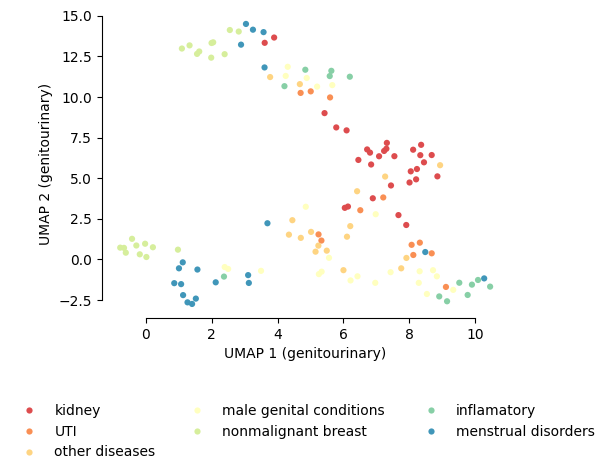

In [167]:
fig, ax = plt.subplots(figsize=(5.25, 4))

sns.scatterplot(local_embed_df.loc[local_embed_df['category'].isin(keep_cat)], 
                x=1, y=0, hue='category', alpha=0.99, s=20, linewidth=0.0, 
                edgecolor='white', ax=ax, marker='o',
                palette="Spectral"
                )

plt.xlabel("UMAP 1 (genitourinary)")
plt.ylabel("UMAP 2 (genitourinary)")

sns.move_legend(
    ax, "lower center",
    bbox_to_anchor=(.5, -0.5), ncol=3, title=None, frameon=False
)

#plt.xlim(-8, 30)

sns.despine(trim=True)

#loc = plticker.MultipleLocator(base=2.0) # this locator puts ticks at regular intervals
#ax.xaxis.set_major_locator(loc)
#ax.yaxis.set_major_locator(loc)



In [63]:
fig.savefig("local_gu.svg", dpi=300)